<a href="https://colab.research.google.com/github/herbert0419/TSF_Assignments_Task-1/blob/main/agriculture_crop_image_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Loading modules

In [2]:
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf 
import keras 
from keras.layers import Conv2D
from keras.models import Sequential
from keras.layers import MaxPool2D
from keras.layers import Flatten
from keras.layers import Dense
from keras.models import Model
from keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
import cv2
import re
import random
random.seed(0)
np.random.seed(0)

# Plotting some images

Text(0.5, 1.0, 'wheat')

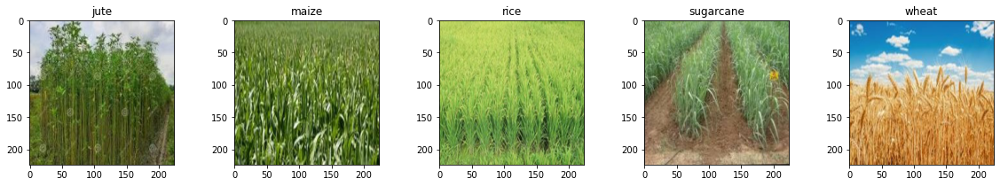

In [3]:
wheat = plt.imread("/content/drive/MyDrive/Agriculture_data/kag2/wheat/wheat0004a.jpeg")
jute = plt.imread("/content/drive/MyDrive/Agriculture_data/kag2/jute/jute005a.jpeg")
cane = plt.imread("/content/drive/MyDrive/Agriculture_data/kag2/sugarcane/sugarcane0010arot.jpeg")
rice = plt.imread("/content/drive/MyDrive/Agriculture_data/kag2/rice/rice032ahs.jpeg")
maize = plt.imread("/content/drive/MyDrive/Agriculture_data/kag2/maize/maize003a.jpeg")
plt.figure(figsize=(20,3))
plt.subplot(1,5,1)
plt.imshow(jute)
plt.title("jute")
plt.subplot(1,5,2)
plt.imshow(maize)
plt.title("maize")
plt.subplot(1,5,3)
plt.imshow(rice)
plt.title("rice")
plt.subplot(1,5,4)
plt.imshow(cane)
plt.title("sugarcane")
plt.subplot(1,5,5)
plt.imshow(wheat)
plt.title("wheat")

# Converting to training and testing data

In [4]:
import os
jutepath = "/content/drive/MyDrive/Agriculture_data/kag2/jute"
maizepath = "/content/drive/MyDrive/Agriculture_data/kag2/maize"
ricepath = "/content/drive/MyDrive/Agriculture_data/kag2/rice"
sugarcanepath = "/content/drive/MyDrive/Agriculture_data/kag2/sugarcane"
wheatpath = "/content/drive/MyDrive/Agriculture_data/kag2/wheat"

jutefilename = os.listdir(jutepath)
maizefilename = os.listdir(maizepath)
ricefilename = os.listdir(ricepath)
sugarcanefilename = os.listdir(sugarcanepath)
wheatfilename = os.listdir(wheatpath)

X= []

In [5]:
for fname in jutefilename:
    X.append([os.path.join(jutepath,fname),0])
for fname in maizefilename:
    X.append([os.path.join(maizepath,fname),1])
for fname in ricefilename:
    X.append([os.path.join(ricepath,fname),2])
for fname in sugarcanefilename:
    X.append([os.path.join(sugarcanepath,fname),3]) 
for fname in wheatfilename:
    X.append([os.path.join(wheatpath,fname),4])  
X = pd.DataFrame(X,columns = ['path','labels'])    

In [6]:
X.head()

,path,labels
0,/content/drive/MyDrive/Agriculture_data/kag2/j...,0
1,/content/drive/MyDrive/Agriculture_data/kag2/j...,0
2,/content/drive/MyDrive/Agriculture_data/kag2/j...,0
3,/content/drive/MyDrive/Agriculture_data/kag2/j...,0
4,/content/drive/MyDrive/Agriculture_data/kag2/j...,0


In [7]:

ohencoder = OneHotEncoder(handle_unknown='ignore',sparse=False)
ohlabel = pd.DataFrame(ohencoder.fit_transform(X[['labels']]),dtype = 'float64',columns = ['label0','label1','label2','label3','label4'])
label_X = X.copy()
X = pd.concat([X,ohlabel],axis = 1)
new_X = X.drop(['labels'],axis = 1)

In [8]:
train,test = train_test_split(new_X,test_size=0.2,random_state=32,shuffle = True)

In [9]:
X_train = train['path'].values
y_train = train.drop(['path'],axis=1).values
X_test = test['path'].values
y_test = test.drop(['path'],axis=1).values

In [10]:
def deep_pipeline(data):
    flat = []
    for i in data:
        img = plt.imread(i)
        img = img/255.
        flat.append(img)
    flat =  np.array(flat)    
    flat = flat.reshape(-1,224,224,3)       
    return flat
    

In [11]:
dx_train = deep_pipeline(X_train)
dx_test = deep_pipeline(X_test)

# Model training

In [12]:
# from keras.applications.vgg19 import VGG19
# vgg = VGG19(include_top=False, input_shape=(224, 224, 3))


# #Freeze base convolutional layers
# vgg.trainable = False
# vgg.summary()

from keras.applications.vgg19 import VGG19
vgg = VGG19(input_shape=(224,224,3),include_top=False,weights = 'imagenet',pooling='avg')
vgg.trainable = False
vggmodel = keras.Sequential([vgg,Dense(1000,activation='tanh'),Dense(1000,activation='tanh'),Dense(1000,activation='tanh'),Dense(5,activation='softmax')])

vggmodel.compile(optimizer = 'adam',loss = 'categorical_crossentropy',metrics=['accuracy'])
vggmodel.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Functional)           (None, 512)               20024384  
_________________________________________________________________
dense (Dense)                (None, 1000)              513000    
_________________________________________________________________
dense_1 (Dense)              (None, 1000)              1001000   
_________________________________________________________________
dense_2 (Dense)              (None, 1000)              1001000   
_________________________________________________________________
dense_3 (Dense)              (None, 5)                 5005      
Total params: 22,544,389
Trainable params: 2,520,005
Non-trainable params: 20,024,384
_________________________________________________________________


In [13]:
hist = vggmodel.fit(dx_train,y_train,epochs=50,validation_split=0.3,batch_size=16)

Epoch 1/50
29/29 [==============================] - 421s 14s/step - loss: 4.5741 - accuracy: 0.2269 - val_loss: 1.3678 - val_accuracy: 0.4508
Epoch 2/50
29/29 [==============================] - 401s 14s/step - loss: 1.2259 - accuracy: 0.5128 - val_loss: 1.2351 - val_accuracy: 0.4870
Epoch 3/50
29/29 [==============================] - 401s 14s/step - loss: 1.0115 - accuracy: 0.6009 - val_loss: 0.8221 - val_accuracy: 0.6736
Epoch 4/50
29/29 [==============================] - 403s 14s/step - loss: 0.7666 - accuracy: 0.6773 - val_loss: 1.3986 - val_accuracy: 0.4767
Epoch 5/50
29/29 [==============================] - 403s 14s/step - loss: 0.9021 - accuracy: 0.6408 - val_loss: 1.0291 - val_accuracy: 0.6166
Epoch 6/50
29/29 [==============================] - 403s 14s/step - loss: 0.7225 - accuracy: 0.6984 - val_loss: 1.5438 - val_accuracy: 0.5181
Epoch 7/50
29/29 [==============================] - 403s 14s/step - loss: 0.8043 - accuracy: 0.7235 - val_loss: 1.2099 - val_accuracy: 0.5699
Epoch 

(0.0, 4.0)

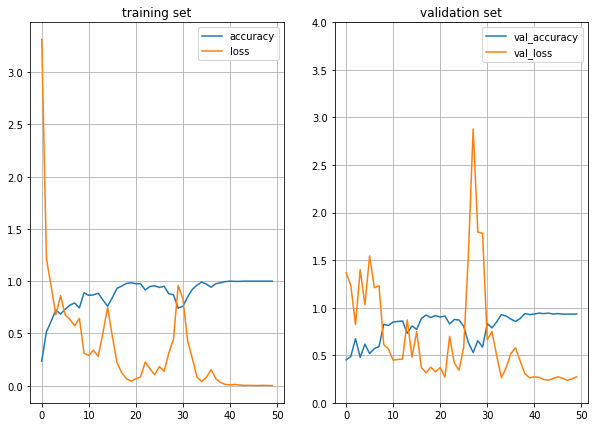

In [14]:
plt.figure(figsize=(10,7))
plt.subplot(1,2,1)
plt.plot(hist.history['accuracy'],label='accuracy')
plt.plot(hist.history['loss'],label='loss')
plt.legend()
plt.title("training set")
plt.grid()
plt.subplot(1,2,2)
plt.plot(hist.history['val_accuracy'],label='val_accuracy')
plt.plot(hist.history['val_loss'],label='val_loss')
plt.legend()
plt.title("validation set")
plt.grid()
plt.ylim((0,4))

# Test set accuracy

In [15]:
score = vggmodel.evaluate(dx_test,y_test)
print("accuracy: ", score[1])

6/6 [==============================] - 103s 16s/step - loss: 0.3616 - accuracy: 0.9255
accuracy:  0.9254658222198486


In [16]:
pred = vggmodel.predict(dx_test)
prediction = np.argmax(pred,axis=1)
true = np.argmax(y_test,axis=1)
best_prob = [pred[num,:][i] for num,i in enumerate(prediction)]

# Confusion matrix

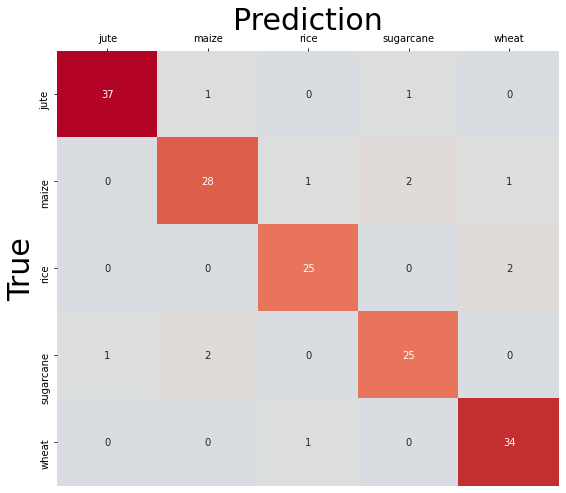

In [17]:
plt.figure(figsize = (9,8))
class_label = ['jute','maize','rice','sugarcane','wheat']
fig = sns.heatmap(confusion_matrix(true,prediction),cmap= "coolwarm",annot=True,vmin=0,cbar = False,
            center = True,xticklabels=class_label,yticklabels=class_label)
fig.set_xlabel("Prediction",fontsize=30)
fig.xaxis.set_label_position('top')
fig.set_ylabel("True",fontsize=30)
fig.xaxis.tick_top()

# Pipelining

In [18]:
def deepmodelpipeline(imagepath,model = vggmodel,label=[-1]):
    pdict = {0:"jute",1:"maize",2:"rice",3:"sugarcane",4:"wheat"}
    pred_x = deep_pipeline([imagepath])
    prediction = model.predict(pred_x)
    pred = np.argmax(prediction[0])
    plt.imshow(plt.imread(imagepath))
    if (label[0]!=-1):
        plt.title("prediction : {0} % {1:.2f} \ntrue        : {2}".format(pdict[pred],prediction[0,pred]*100,pdict[np.argmax(label)]))
    else:
        plt.title("prediction : {0}, % {1:.2f}".format(pdict[pred],prediction[0,pred]*100))

# Prediction on sample images

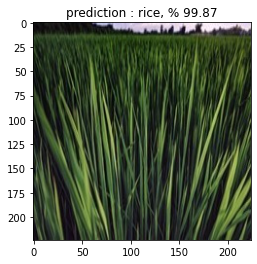

In [20]:
deepmodelpipeline('/content/drive/MyDrive/Agriculture_data/kag2/rice/rice024ahs.jpeg')

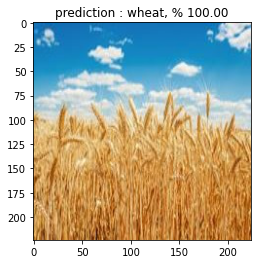

In [21]:
deepmodelpipeline('/content/drive/MyDrive/Agriculture_data/kag2/wheat/wheat0004a.jpeg')

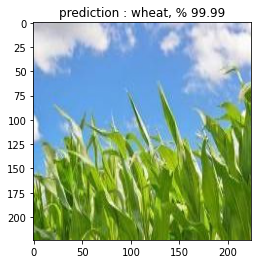

In [22]:
deepmodelpipeline("/content/drive/MyDrive/Agriculture_data/kag2/maize/maize008ahf.jpeg")

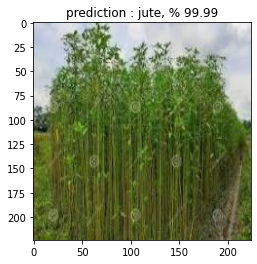

In [23]:
deepmodelpipeline("/content/drive/MyDrive/Agriculture_data/kag2/jute/jute005a.jpeg")

# Prediction on test images

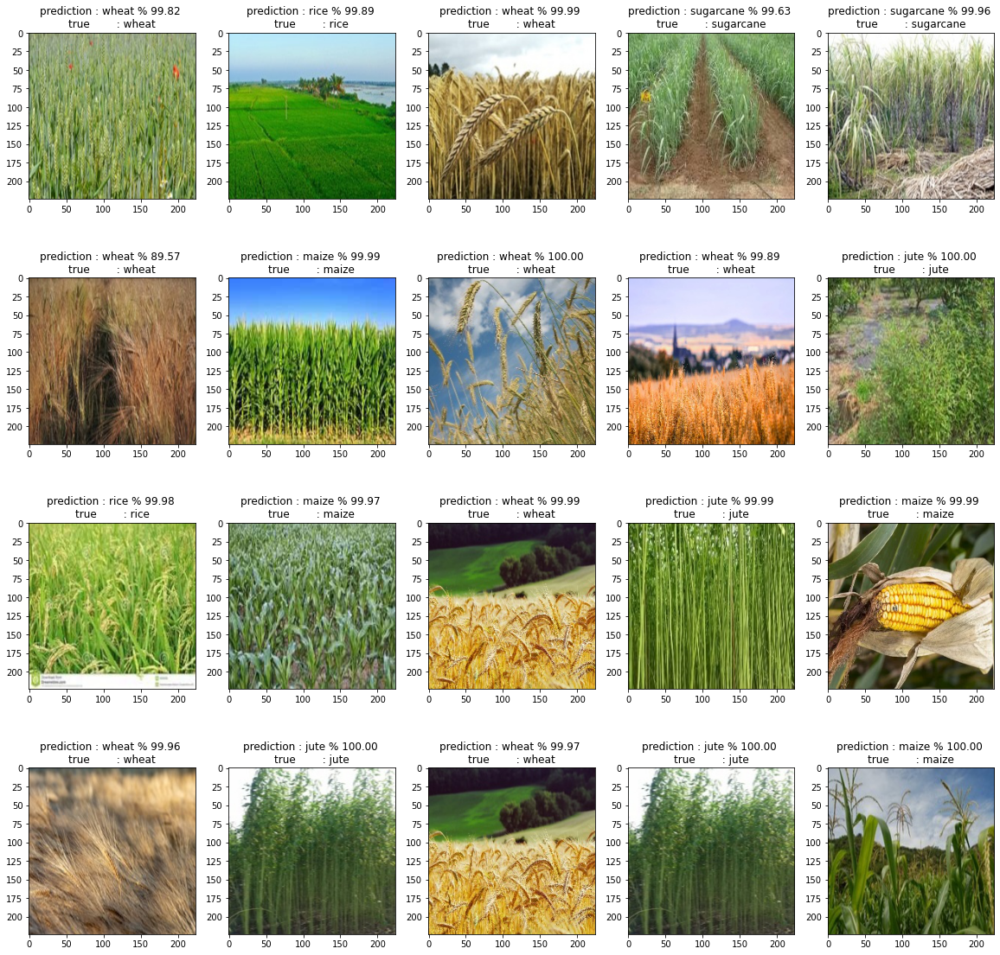

In [24]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[0:20]):
    plt.subplot(4,5,num+1)
    deepmodelpipeline(path,vggmodel,y_test[num])

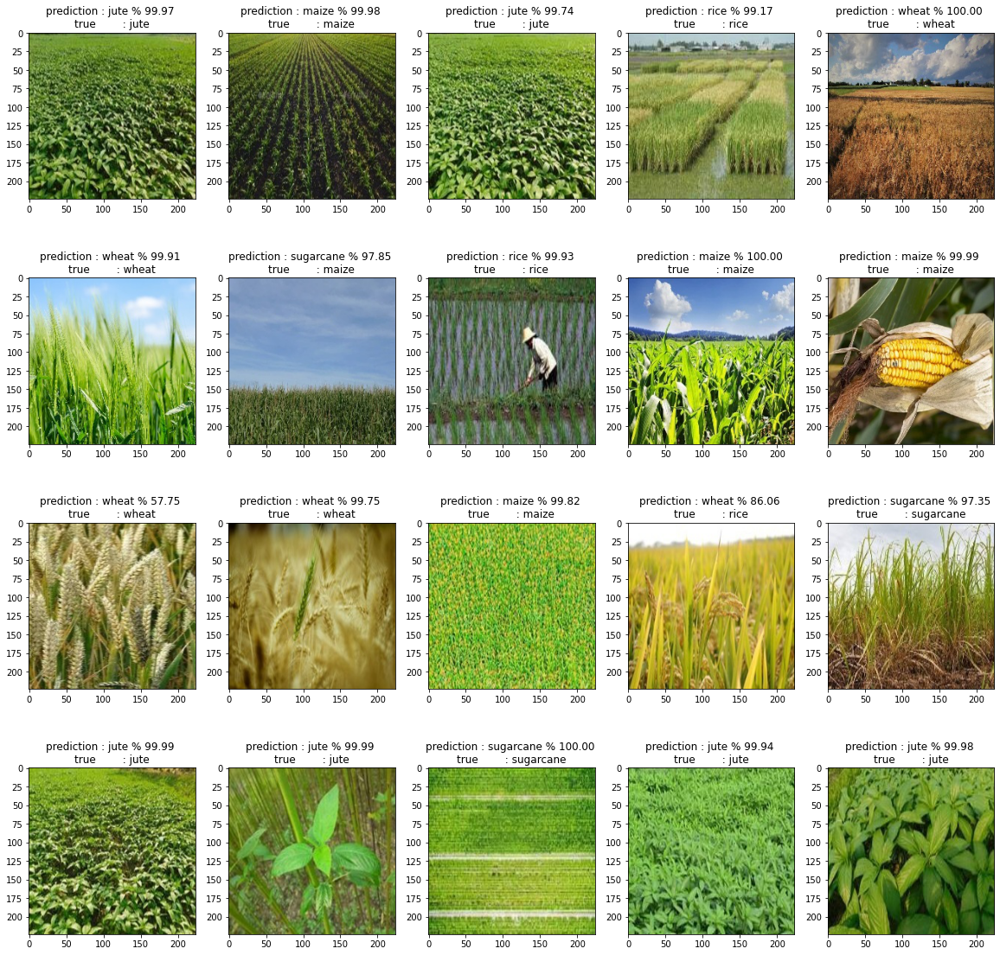

In [25]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[20:40]):
    plt.subplot(4,5,num+1)
    deepmodelpipeline(path,vggmodel,y_test[num+20])

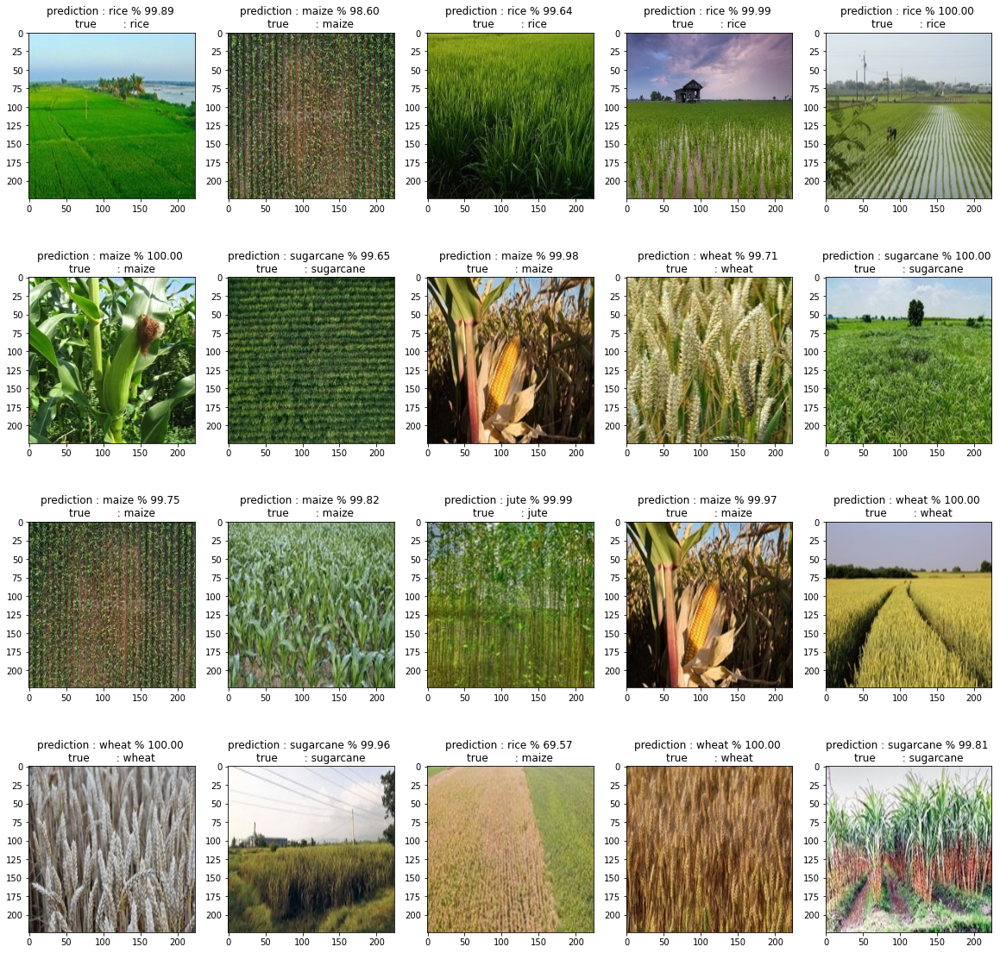

In [26]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[40:60]):
    plt.subplot(4,5,num+1)
    deepmodelpipeline(path,vggmodel,y_test[num+40])

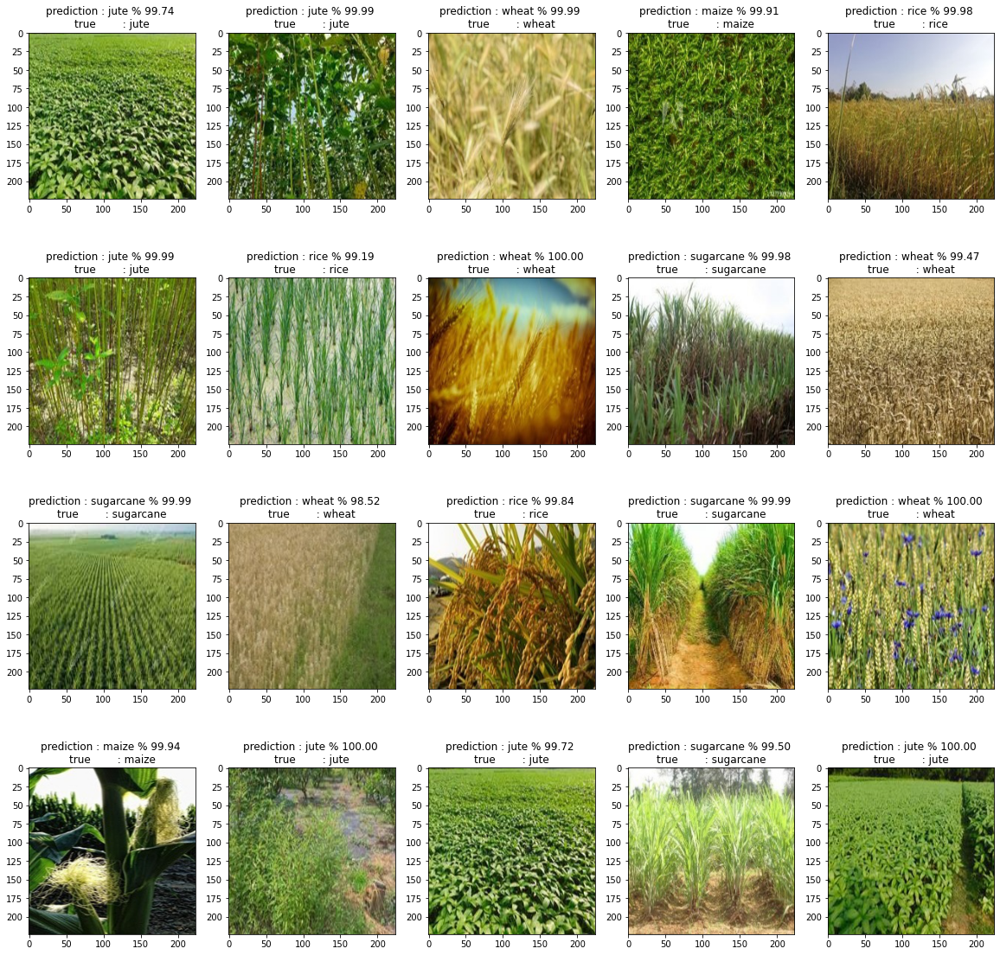

In [27]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[100:120]):
    plt.subplot(4,5,num+1)
    deepmodelpipeline(path,vggmodel,y_test[num+100])

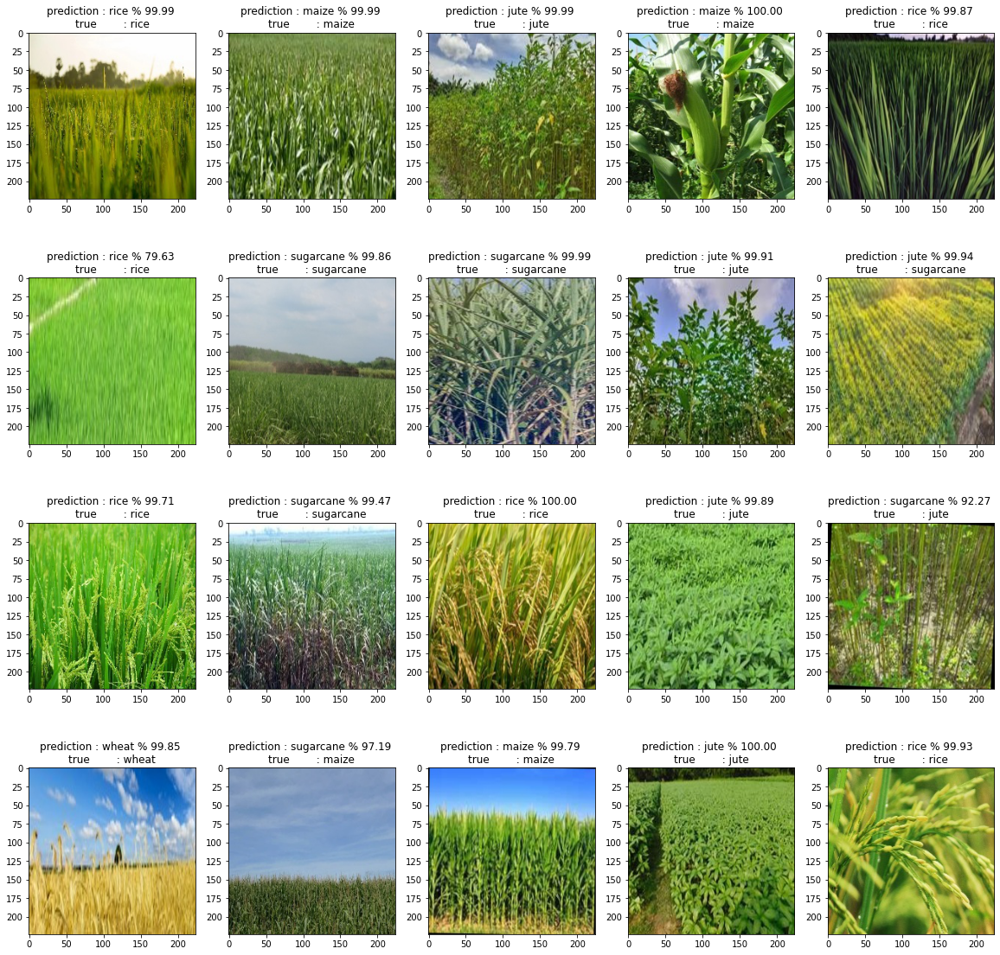

In [28]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[140:160]):
    plt.subplot(4,5,num+1)
    deepmodelpipeline(path,vggmodel,y_test[num+140])

# Saving Model

In [29]:
vggmodel.save_weights("vggmodelweight.h5")

# <font color = "red"> If you like this kernel. Then appreciate me with an upvote</font>

# EVALUATING MODEL ON TESTSSSS DATASET IMAGES

## Loading necessary preprocessing functions

In [1]:
def resize_image(image_array):
    return cv2.resize(image_array,(224,224))
def rescale_image(image_array):
    return image_array*1./255
def read_image(image_path):
    return plt.imread(image_path)
def plot_image(image_array):
    try:
        plt.imshow(image_array)
    except:
        plt.imshow(image_array[0])
def preprocess_image(image_path,reshape = True):
    image = read_image(image_path)
    image = resize_image(image)
    image = rescale_image(image)
    if(reshape ==  True):
        image = image.reshape(-1,image.shape[0],image.shape[1],image.shape[2])    
    return image
def preprocess_imageslist(image_list):
    imagelist = np.array([preprocess_image(img,reshape=False) for img in image_list])
    return imagelist
def predict_and_plot(image,model):
    pred_dict = {0:"jute",1:"maize",2:"rice",3:"sugarcane",4:"wheat"}
    plt.imshow(image[0])
    prediction = model.predict(image) 
    pred = pred_dict[np.argmax(prediction)]
    plt.title(pred)
%matplotlib inline
def predict_and_plot5(imagelist,model):
    pred_dict = {0:"jute",1:"maize",2:"rice",3:"sugarcane",4:"wheat"}
    plt.figure(figsize=(20,10))
    for num,image in enumerate(imagelist):
        plt.subplot(1,5,num+1)
        plt.imshow(image)
        prediction = model.predict(image.reshape(-1,224,224,3)) 
        pred = pred_dict[np.argmax(prediction)]
        plt.title(pred)
def predict_and_plot51(imagelist,model):
    pred_dict = {0:"jute",1:"maize",2:"rice",3:"sugarcane",4:"wheat"}
    plt.figure(figsize=(100,10))
    for i in range(0,55,5):
        predict_and_plot5(imagelist[i:i+5],vggmodel)
def predict_and_plot30(imagelist,model):
    plt.figure(figsize=(40,10))
    for i in range(0,len(imagelist),5):
        predict_and_plot5(imagelist[i:i+5],vggmodel)

In [7]:
import pandas as pd
testdata = pd.read_csv('/content/drive/MyDrive/Agriculture_data/testssss/testdata.csv')

FileNotFoundError: ignored

In [8]:
imagepath = testdata['testpath'].values
true_label = testdata['croplabel'].values
testdata.head()

NameError: ignored

In [ ]:
process_image = preprocess_imageslist(imagepath)

In [ ]:
predict_and_plot51(process_image,model=vggmodel)

In [ ]:
test_prediction = np.argmax(vggmodel.predict(process_image),axis=1)

In [ ]:
accuracy_score(true_label,test_prediction)

In [ ]:
plt.figure(figsize = (9,8))
class_label = ['jute','maize','rice','sugarcane','wheat']
fig = sns.heatmap(confusion_matrix(true_label,test_prediction),cmap= "coolwarm",annot=True,vmin=0,cbar = False,
            center = True,xticklabels=class_label,yticklabels=class_label)
fig.set_xlabel("Prediction",fontsize=30)
fig.xaxis.set_label_position('top')
fig.set_ylabel("True",fontsize=30)
fig.xaxis.tick_top()

In [ ]:
classify = true_label==test_prediction
wrong_classify = [num for num,p in enumerate(classify) if p==False]
correct_classify = [num for num,p in enumerate(classify) if p==True]

In [ ]:
correct_class_image = process_image[correct_classify]
wrong_class_image = process_image[wrong_classify]

# Wrong classified Images

In [ ]:
predict_and_plot30(wrong_class_image,vggmodel)

# Correct Classified Images

In [ ]:
predict_and_plot30(correct_class_image,vggmodel)

# Creating dataframe to submit testssss data prediction

In [ ]:
labels = test_prediction.reshape(-1,1)
imagepath = imagepath.reshape(-1,1)
df = pd.DataFrame(np.append(imagepath,labels,axis=1),columns=['pathname','label'])
df.head()

In [ ]:
df.to_csv('submission.csv')

# Enter your path of your image You want to predict


**first upload image through add data**

In [ ]:
get_image_path = "../input/testssss/test_crop_image/jute-field.jpg"

In [ ]:
image1 = preprocess_image(get_image_path)
predict_and_plot(image1,model = vggmodel)

# <font color = "red"> If you like this kernel. Then appreciate me with an upvote</font>